# Coupled FHN model

In this notebook we want to explore coupled, excitable FitzHugh-Nagumo systems. First, in the context of spatial neares-neighbour, diffusion-like coupling of cells in the heart. And second, coupled on a random, directed network like neurons in the brain.

The general model is composed of two variables at each cell $i$, the (fast) activator $u_i$ and the inhibitor $v_i$, and reads

$$
\dot{u}_i=\alpha u_i (u_i-\beta)(1-u_i) - v_i  + \sum_{j}G_{ij}u_j+\eta_i\\
\dot{v}_i=\epsilon(u_i-v_i),
$$
where $\eta_i$ is a Gaussian noise that we only apply for the brain dynamics. 
Note that the parameters $\alpha$, $\beta$, and $\epsilon$ are homogeneous across cells, and the (spatial) coupling is only mediated via the acivators $u_i$.

In [ ]:
import numpy as np 
import pickle

import matplotlib.pyplot as plt

import os, sys
rootpath = os.path.join(os.getcwd(), '..')
sys.path.append(rootpath)

import networkx as nx

import jax
import jax.numpy as jnp
import jax.random as jr
from jax.experimental import sparse

import diffrax
from diffrax import diffeqsolve, ODETerm, ControlTerm, MultiTerm, VirtualBrownianTree, SaveAt, ShARK
from tqdm.notebook import tqdm

import lineax

In [2]:
## Run this line only if you have installed jax with cuda and there is a GPU in your machine but you anyway want to use the CPU instead 
#jax.config.update('jax_platform_name', 'cpu')

# before execute any computation / allocation
print(jax.numpy.ones(3).device)

cuda:0


## Nullclines and Parameter Exploration

In [3]:
def FHN(t, y, return_nullclines=False):
    print(t,end='\r')
    u = y[:N]
    v = y[N:]
    du = a*u*(u-b)*(1-u) + G.dot(u) - v
    dv = e*(u-v)
    return np.append(du,dv)

Plot the nullclines in phase space

(-0.6, 1.2)

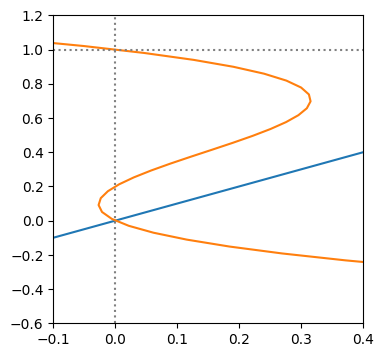

In [4]:
u_array = np.linspace(-1,3,100)
fig, ax = plt.subplots(1,1,figsize=(4,4))
ax.plot(u_array,u_array)
e = 0.05 
a, b = (3, 0.2)
ax.plot(a*u_array*(u_array-b)*(1-u_array), u_array)
ax.axvline(0, c='grey', ls=':')
ax.axhline(1, c='grey', ls=':')
ax.set_xlim(-0.1,.4)
ax.set_ylim(-.6,1.2)

# Directed Network Coupling (🧠)

To simulate neuronal dynamics in the brain, we i) choose the coupling $G_{ij}$ to represent a directed ER graph with weak, random (but homogeneous) coupling strengths, and ii) we simulate a constant Gaussian noise $\eta_i$ for each neuron emulating the constant fluctuating input from other brain areas. 

In [5]:
#random network implementation
def random_graph(N, k, J, seed=0, weights='homogeneous', weight_generator=None):
    '''
    Creates a random, directed, and weighted Erdos Renyi graph.
    Parameters:
        N: number of nodes
        k: mean nodal degree
        J: weight parameters. If homogeneous weights: constant float, if gaussian weigts: J=(J_mean, J_sigma)
        seed: seed for the ER graph generation
        weights: Type of weights, 'homogeneous' or 'gaussian'
        generator: random generator for random weights
    Returns:
        sparse jax.experimental coupling matrix 
    '''
    p = k / (N - 1)
    
    # Create ER graph
    G = nx.erdos_renyi_graph(N, p, directed=True, seed=seed)
    
    # Put weights
    for u, v in G.edges():
        if weights=='homogeneous':
            G[u][v]['weight'] = J#generator.normal(J, J/5)
        elif weights=='gaussian':
            G[u][v]['weight'] = weight_generator.normal(J[0], J[1])
    
    # Get the adjacency matrix in sparse format
    adj_matrix = nx.adjacency_matrix(G, weight='weight')
    
    return sparse.BCSR.from_scipy_sparse(adj_matrix)

In [6]:
# Deterministic part of the differential equation
def FHN_graph(t, y, args):
    N, a, b, e, Du, L, _ = args 
    u = y[:N]
    v = y[N:]
    
    du = a*u*(u-b)*(1-u) + Du*(L@u) - v 
    dv = e*(u-v)

    return jnp.append(du,dv)

# Stochastic part of the differential equation
def FHN_graph_noise(t, y, args):
    N, _, _, _, _,_, noise_amp = args 
    noise = noise_amp*jnp.ones((2*N))
    noise = noise.at[N:].set(0)
    return lineax.DiagonalLinearOperator(noise)

In [ ]:
N = 1000 # Put N here for jax to be able to JIT compile the solve_brain function pre-runtime. 
N_times = 2000 # output times. Again, here for JIT

# Solve the brain. Whouu!
@jax.jit
def solve_brain(L,y0='random',a=3,b=0.2,e=0.01,Du=.1,T=1000, noise_amp=.1, max_steps=1000000, solver=ShARK(),rtol=1e-2, atol=1e-4,dt0=1e-2, noise_tol=1e-4, pcoeff=0.1, icoeff=0.0, dcoeff=0):
    '''
    Takes in all simulation and solver parameters and returns a solution of the coupled SDEs
    Parameters:
        TODO
    Returns:
        diffrax.Solution object
    '''
    if type(y0) == str and y0=='zeros':
        y0 = jnp.zeros(2*N)
    
    if type(y0) == str and y0=='random':
        y0 = jax.random.normal(jr.PRNGKey(0), shape=(2*N))*e
    
    deterministic_term = ODETerm(FHN_graph)
    brownian_path = VirtualBrownianTree(0., T, tol=noise_tol, shape=(2*N,), key=jr.PRNGKey(1),levy_area=diffrax.SpaceTimeLevyArea)
    noise_term = ControlTerm(FHN_graph_noise,brownian_path)
    terms = MultiTerm(deterministic_term, noise_term)

    saveat = SaveAt(ts=jnp.linspace(0, T, N_times))
    stepsize_controller = diffrax.PIDController(rtol=rtol, atol=atol, pcoeff=pcoeff, dcoeff=dcoeff, icoeff=icoeff)

    sol = diffeqsolve(terms, solver, 0, T, dt0, y0, args=(N,a,b,e,Du,L, noise_amp), saveat=saveat,max_steps=max_steps, progress_meter=diffrax.TqdmProgressMeter(), stepsize_controller=stepsize_controller)
    return sol

## Single simulation

In [8]:
# Parameters
# Random number generator in case we want gaussian weights
#single_random_generator = np.random.default_rng(0)
k=50
m=0.705 # Mean J/k
T=5000
L=random_graph(N,k,J=m/k, weights='homogeneous')#, weight_generator=single_random_generator)

In [9]:
# Load in a sufficiently random initial state generated from an uncoupled system (code below)
random_initials = np.load('notebooks/simulation_data/brain_phase-transition_random_state_N{}.pkl'.format(N), allow_pickle=True)

In [10]:
sol = solve_brain(L,y0=random_initials,T=T, pcoeff=0.01)

79.22%|███████▉  | [12:22<03:13,  9.34s/%]E1205 16:50:05.879036 2807725 pjrt_stream_executor_client.cc:3085] Execution of replica 0 failed: INTERNAL: CustomCall failed: CpuCallback error: Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel_launcher.py", line 18, in <module>
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/traitlets/config/application.py", line 1075, in launch_instance
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/kernelapp.py", line 739, in start
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/tornado/platform/asyncio.py", line 

XlaRuntimeError: INTERNAL: CustomCall failed: CpuCallback error: Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel_launcher.py", line 18, in <module>
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/traitlets/config/application.py", line 1075, in launch_instance
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/kernelapp.py", line 739, in start
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/tornado/platform/asyncio.py", line 205, in start
  File "/home/sbauer/.pyenv/versions/3.11.10/lib/python3.11/asyncio/base_events.py", line 608, in run_forever
  File "/home/sbauer/.pyenv/versions/3.11.10/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once
  File "/home/sbauer/.pyenv/versions/3.11.10/lib/python3.11/asyncio/events.py", line 84, in _run
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 534, in process_one
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 362, in execute_request
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 778, in execute_request
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 449, in do_execute
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/ipykernel/zmqshell.py", line 549, in run_cell
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3075, in run_cell
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3130, in _run_cell
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/IPython/core/async_helpers.py", line 128, in _pseudo_sync_runner
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3334, in run_cell_async
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3517, in run_ast_nodes
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3577, in run_code
  File "/tmp/ipykernel_2807725/1524629372.py", line 1, in <module>
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/traceback_util.py", line 180, in reraise_with_filtered_traceback
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/pjit.py", line 338, in cache_miss
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/pjit.py", line 188, in _python_pjit_helper
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/core.py", line 2803, in bind
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/core.py", line 442, in bind_with_trace
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/core.py", line 955, in process_primitive
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/pjit.py", line 1738, in _pjit_call_impl
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/pjit.py", line 1714, in call_impl_cache_miss
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/pjit.py", line 1668, in _pjit_call_impl_python
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/profiler.py", line 333, in wrapper
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/interpreters/pxla.py", line 1278, in __call__
  File "/data.nst/sbauer/envs/poetry-envs/.venv/perspective-heart-and-brain-xSYSiPOC-py3.11/lib/python3.11/site-packages/jax/_src/interpreters/mlir.py", line 2767, in _wrapped_callback
KeyboardInterrupt: 

In [ ]:
# for ease of notation
u_sol = sol.ys[:,:N].T  # u over time
v_sol = sol.ys[:,N:].T  # v over time

Export single state to be used as an initial state later on 

In [ ]:
if False: # Change to True. Added here to not accidentally overwrite data :)
    filepath = 'simulation_data/brain_phase-transition_random_state_N{}.pkl'.format(N)
    with open(filepath,'wb') as f:
        i = -1
        pickle.dump(sol.ys[i,:].T, f)

### Plot single simulation

Plot a kymograph of the neurons' activities

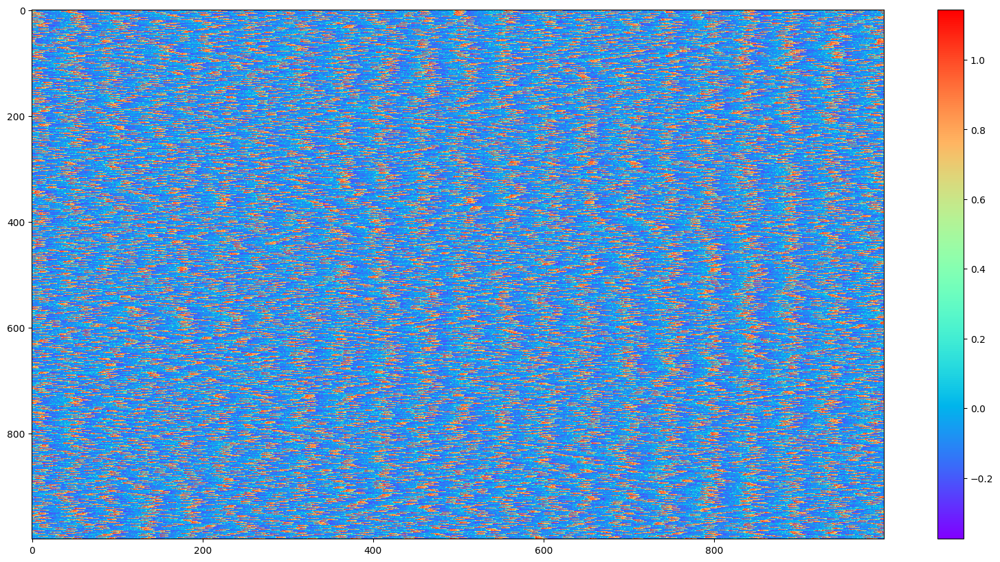

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(20, 10))
# Kymograph with timeseries of all neurons' activities (u)
im = ax.imshow(u_sol, aspect='auto', cmap='rainbow', interpolation='none')
ax.set_xlabel(r't')
ax.set_ylabel(r'Neuron ID')

# plot colorbar
cbar = fig.colorbar(im, ax=ax, label=r'u_i')

Plot the 'EEG'

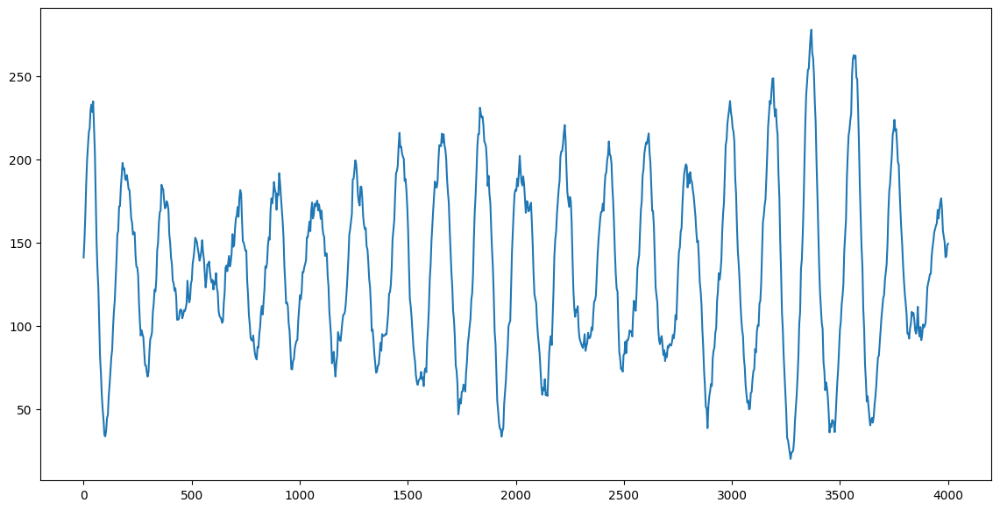

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(14, 7))

full_EEG = u_sol.sum(axis=0)
sampled_EEG = u_sol[np.random.randint(0,N,size=100)].sum(axis=0)
ax.plot(sol.ts, full_EEG)
ax.set_xlabel(r't')
ax.set_ylabel(r'$\mathrm{EEG}=\sum_i u_i$')


# Phase Transition

### Simulate a range of parameters

In [13]:
m_array = np.arange(0,1.5,.05)

random_generator = np.random.default_rng(0)

k = 50
T = 6000.
t_steps = 1000

In [ ]:
u_solutions = np.empty((len(m_array),N, t_steps))
for i,m in enumerate(m_array):
    L=random_graph(N,k,J=m/k, generator=random_generator)
    print("{}/{}, m={}".format(i+1,len(m_array), m))
    sol = solve_brain(L,T=T,rtol=1e-2, atol=1e-3,dt0=1e-2, noise_tol=1e-4, solver=diffrax.ShARK()) #y0=np.append(random_generator.uniform(0,0.4, size=N), (random_generator.integers(0,2, size=N))*1)

    u_solutions[i] = sol.ys[:,:N].T  # u over time

1/30, m=0.0


100.00%|██████████| [01:25<00:00,  1.17%/s]


2/30, m=0.05


100.00%|██████████| [01:25<00:00,  1.17%/s]


3/30, m=0.1


100.00%|██████████| [01:25<00:00,  1.17%/s]


4/30, m=0.15000000000000002


100.00%|██████████| [01:20<00:00,  1.24%/s]


5/30, m=0.2


100.00%|██████████| [01:14<00:00,  1.34%/s]


6/30, m=0.25


100.00%|██████████| [01:11<00:00,  1.39%/s]


7/30, m=0.30000000000000004


100.00%|██████████| [01:14<00:00,  1.35%/s]


8/30, m=0.35000000000000003


100.00%|██████████| [01:15<00:00,  1.32%/s]


9/30, m=0.4


100.00%|██████████| [01:14<00:00,  1.34%/s]


10/30, m=0.45


100.00%|██████████| [01:13<00:00,  1.35%/s]


11/30, m=0.5


100.00%|██████████| [01:14<00:00,  1.34%/s]


12/30, m=0.55


100.00%|██████████| [01:14<00:00,  1.34%/s]


13/30, m=0.6000000000000001


100.00%|██████████| [01:15<00:00,  1.32%/s]


14/30, m=0.65


100.00%|██████████| [01:16<00:00,  1.31%/s]


15/30, m=0.7000000000000001


100.00%|██████████| [01:20<00:00,  1.24%/s]


16/30, m=0.75


100.00%|██████████| [01:17<00:00,  1.29%/s]


17/30, m=0.8


100.00%|██████████| [01:17<00:00,  1.29%/s]


18/30, m=0.8500000000000001


100.00%|██████████| [01:17<00:00,  1.29%/s]


19/30, m=0.9


100.00%|██████████| [01:18<00:00,  1.27%/s]


20/30, m=0.9500000000000001


100.00%|██████████| [01:16<00:00,  1.30%/s]


21/30, m=1.0


100.00%|██████████| [01:17<00:00,  1.30%/s]


22/30, m=1.05


100.00%|██████████| [01:11<00:00,  1.39%/s]


23/30, m=1.1


100.00%|██████████| [01:12<00:00,  1.37%/s]


24/30, m=1.1500000000000001


100.00%|██████████| [01:12<00:00,  1.38%/s]


25/30, m=1.2000000000000002


100.00%|██████████| [01:11<00:00,  1.39%/s]


26/30, m=1.25


100.00%|██████████| [01:12<00:00,  1.38%/s]


27/30, m=1.3


100.00%|██████████| [01:12<00:00,  1.38%/s]


28/30, m=1.35


100.00%|██████████| [01:17<00:00,  1.29%/s]


29/30, m=1.4000000000000001


100.00%|██████████| [01:18<00:00,  1.27%/s]


30/30, m=1.4500000000000002


100.00%|██████████| [01:17<00:00,  1.28%/s]


Save data

In [ ]:
filepath = 'simulation_data/brain_phase-transition_homogeneousJ.pkl'
with open(filepath,'wb') as f:
    pickle.dump(u_solutions, f)

### Analyse range of parameters

Load data

In [10]:
u_solutions_loaded = np.load('notebooks/simulation_data/brain_phase-transition_homogeneousJ.pkl',allow_pickle=True)

In [11]:
u_solutions = u_solutions_loaded

Plot single simulation to check the data

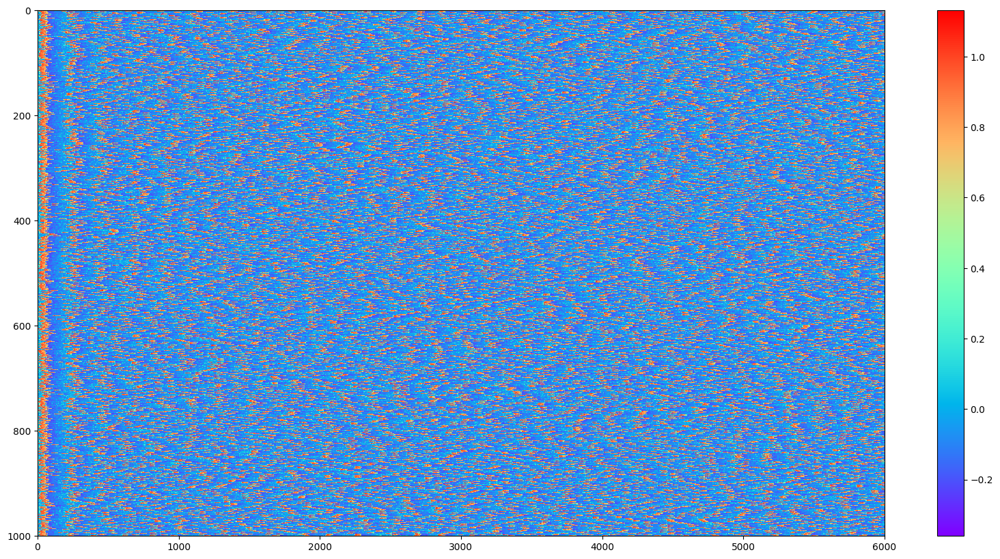

In [ ]:
simulation_id = 0 # which simulation to look at

fig, ax = plt.subplots(1,1, figsize=(20, 10))

# Kymograph with timeseries of all neurons' activities (u)
im = ax.imshow(u_solutions[simulation_id], aspect='auto', cmap='rainbow', interpolation='none')
ax.set_xlabel(r't')
ax.set_ylabel(r'Neuron ID')
ax.title(f'm: {m_array[simulation_id]}')

# plot colorbar
cbar = fig.colorbar(im, ax=ax, label=r'u_i')

### Qualitative look at the phase transition

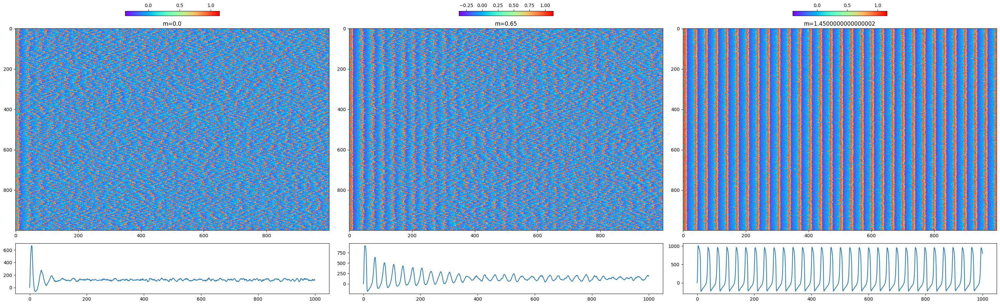

In [ ]:
fig, (ax_kymographs,ax_EEGs) = plt.subplots(2,3, figsize=(30, 10),height_ratios=[1,0.2])

for i, ax_kymo, ax_EEG in zip((0,len(u_solutions)//2-2,len(u_solutions)-1), ax_kymographs, ax_EEGs):
    ax_kymo.set_title('m={}'.format(m_array[i]))
    # heatmap with all neurons timeseries x:t, y:neuron_id
    im = ax_kymo.imshow(u_solutions[i], aspect='auto', cmap='rainbow', interpolation='none')
    ax_kymo.set_xlabel(r't')
    ax_kymo.set_ylabel(r'Neuron ID')

    # plot colorbar
    cbar = fig.colorbar(im, ax=ax_kymo,location='top',shrink=0.3, label=r'u_i')

    # plot EEG
    full_EEG = u_solutions[i].sum(axis=0)
    sampled_EEG = u_solutions[i][np.random.randint(0,N,size=100)].sum(axis=0)
    ax_EEG.plot(full_EEG)
    ax_EEG.set_xlabel(r't')
    ax_EEG.set_ylabel(r'$\sum_i u_i$')
fig.tight_layout()

In [ ]:
fig.savefig('figures/brain_phase-transition-kymos_homoogeneousJ.pdf')

### Quantify the phase transition
By mean and max of EEG

In [15]:
all_full_EEGs = u_solutions_loaded[:,:,500:].sum(axis=1)
mean_EEG = all_full_EEGs.mean(axis=1)
max_EEG = all_full_EEGs.max(axis=1)

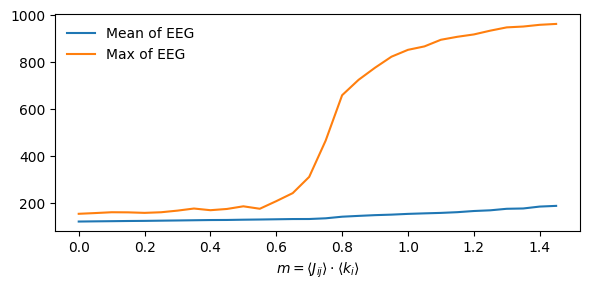

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(6,3))

ax.plot(m_array, mean_EEG, label='Mean of EEG')
ax.plot(m_array, max_EEG, label='Max of EEG')

ax.legend(frameon=False)
ax.set_xlabel(r'$m=\langle J_{ij}\rangle\cdot\langle k_i\rangle$')
fig.tight_layout()

In [16]:
fig.savefig('figures/brain_phase-transition_homoogeneousJ.pdf')

By power spectrum entropy

In [19]:
@jax.jit
def calculate_entropy(power_spectrum):
    epsilon = 1e-12  # Small constant to prevent division by zero
    power_spectrum /= jnp.sum(power_spectrum) + epsilon  # Normalize power spectrum
    entropy = -jnp.sum(power_spectrum * jnp.log(power_spectrum + epsilon))  # Calculate entropy
    return jnp.abs(entropy), power_spectrum  # Ensure entropy is not negative

@jax.jit
def process_element(array, i):
    fft_result = jnp.fft.fft(array[i, :])
    fft_result_shifted = jnp.fft.fftshift(fft_result)  # Shift the zero-frequency component to the center
    power_spectrum = jnp.abs(fft_result_shifted) ** 2
    entropy, power_spectrum = calculate_entropy(power_spectrum)
    return entropy

def average_entropy(array):
    N, T = array.shape
    
    # Vectorized processing of all elements
    vectorized_process = jax.vmap(lambda i: process_element(array, i))(jnp.arange(N))
    
    average_entropy = jnp.mean(vectorized_process)
    return average_entropy

In [20]:
entropies = np.array([average_entropy(u_solution[:,500:]) for u_solution in u_solutions])

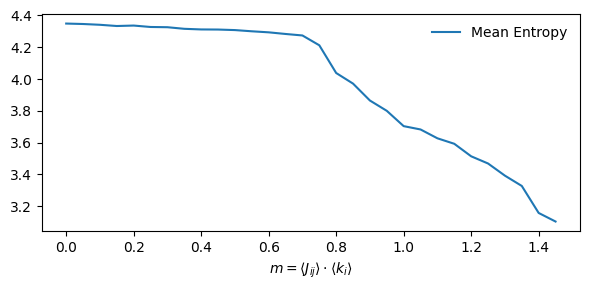

In [21]:
fig, ax = plt.subplots(1,1, figsize=(6,3))

ax.plot(m_array, entropies, label='Mean Entropy')
ax.legend(frameon=False)
ax.set_xlabel(r'$m=\langle J_{ij}\rangle\cdot\langle k_i\rangle$')
fig.tight_layout()

In [22]:
fig.savefig('figures/brain_phase-transition-entropy_homoogeneousJ.pdf')

By entropy of the average, binarized rate levels

In [ ]:
# functiom to calculate the rate of u by thresholding

def threshold_matrix(matrix: jnp.ndarray, threshold: float) -> jnp.ndarray:
    """
    Scans a JAX matrix and returns a binary matrix where elements above 
    the threshold are 1 and elements below or equal to the threshold are 0.
    
    Parameters:
    matrix (jnp.ndarray): Input JAX matrix.
    threshold (float): Threshold value.
    
    Returns:
    jnp.ndarray: A binary matrix of the same shape as the input.
    """
    # Use jax.numpy.where to create a binary matrix
    return jnp.where(matrix > threshold, 1, 0)

# calculate the pmf of the average rate 

def calculate_pmf(array):
    """
    Returns the probability mass function (pmf) of the input array.
    
    Parameters:
        array (numpy.ndarray): Input array of data.
    
    Returns:
        numpy.ndarray: The unique values of the array 
        numpy.ndarray: The pmf of the input array.

    """
    
    # Calculate frequencies
    unique, counts = jnp.unique(array, return_counts=True)
    frequencies = counts / len(array)
    
    return unique, frequencies

def entropy_pmf(data):
    '''
    Calculate the entropy of a dataset with discrete values.
    Parameters:
    data (jax.numpy.ndarray): dataset with discrete values.
    Returns:
    float: The entropy of the pmf of the dataset.
    '''
    _, prob=calculate_pmf(data)
    epsilon = 1e-12  # Small constant to prevent division by zero
    
    entropy = -jnp.sum(prob * jnp.log2(prob + epsilon))  # Calculate entropy
    return jnp.abs(entropy)  # Ensure entropy is not negative


Rate levels for some sample simulations

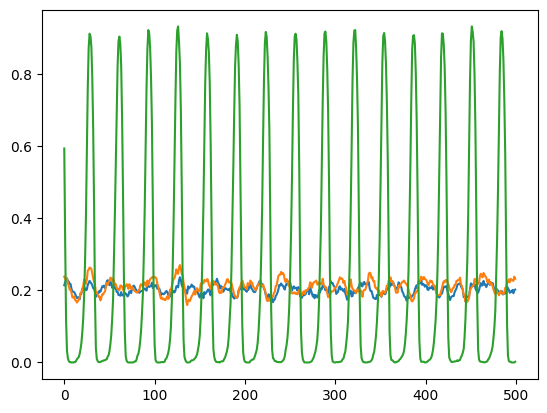

In [ ]:
threshold = 0.5
binarized = threshold_matrix(u_solutions_loaded[:,:,500:], threshold)

means = binarized.mean(axis=1)

fig, ax = plt.subplots(1,1, figsize=(5,4))
simulation_ids = (0,14,29)
ax.plot(means[simulation_ids,:].T, label=f'{m_array[simulation_ids]}')
ax.set_xlabel(r't')
ax.set_ylabel(r'Mean binarized activitiy')

Probability mass function for sample simulation

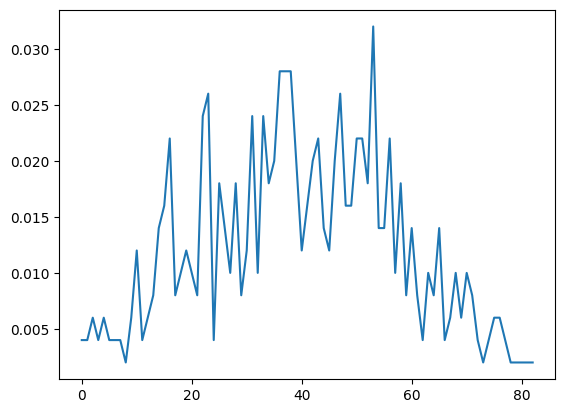

In [ ]:
unique_values, pmf = calculate_pmf(means[simulation_id])

fig, ax = plt.subplots(1,1, figsize=(5,4))
ax.plot(unique_values, pmf)
ax.set_xlabel(r'activcity')
ax.set_ylabel(r'PMF')

Calculate and plot the entropies

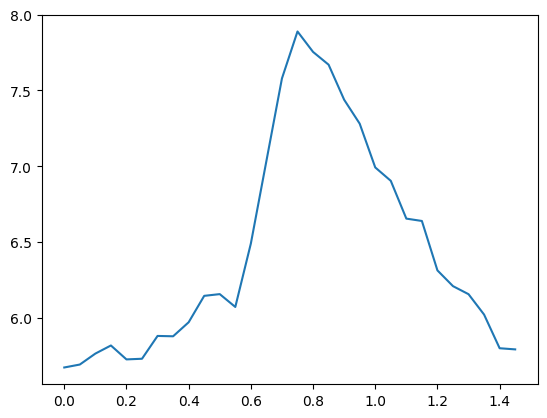

In [ ]:
entropies = [entropy_pmf(mean) for mean in means]

fig, ax = plt.subplots(1,1, figsize=(5,4))
ax.plot(m_array, entropies)
ax.set_xlabel(r'$m=J/k$')
ax.set_ylabel(r'Entropy')